# Исследование заведений общественного питания Москвы


**Описание проекта:**
Цель данного проекта — исследовать рынок заведений общественного питания Москвы, чтобы помочь фонду «Shut Up and Take My Money» принять решение о запуске нового заведения. Особое внимание уделено кофейням, так как заказчики стремятся создать уникальную и популярную кофейню, вдохновленную сериалом «Друзья».

**Цель исследования:**
Изучить текущее распределение заведений общественного питания по районам Москвы, их категории, ценовые параметры и рейтинги. Для кофеен отдельно — определить оптимальный район, формат и ценовую политику будущего заведения.

**Ход исследования:**

- Общий анализ заведений: Оценка количества заведений, распределения по категориям и районам, а также выявление ключевых факторов их успешности.
- Детализация анализа кофеен: Определение особенностей расположения, рейтингов и ценовой политики кофеен. Выявление круглосуточных заведений, сетевых и несетевых кофеен, а также предпочтительных районов для запуска нового заведения.
- Финальные рекомендации: Формирование предложений по запуску нового заведения на основе полученных данных.

**Ожидаемые результаты:**
Рекомендации по выбору района для открытия нового заведения, включая конкретный формат, ценовую категорию и целевую аудиторию.

Для начала работы над проектом импортируем необходимые библиотеки:

In [ ]:
#импортируем все библиотеки
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import datetime as dt
import math
import plotly.express as px
import folium
from folium import Map, Marker, Choropleth, GeoJson
from folium.plugins import MarkerCluster
from folium.features import CustomIcon

import warnings

In [ ]:
#скроем лишние предупреждения
warnings.filterwarnings("ignore")

#настройки Pandas для вывода всех столбцов
pd.set_option("display.max_columns", None)

#установка максимального количества строк для отображения
pd.set_option(
    "display.max_rows", 50)

pd.set_option(
    "display.max_colwidth", 100)

#установка ширины дисплея
pd.set_option(
    "display.width", 1000
)

Загрузим файл рассмотрим его первые строчки:

In [ ]:
#загрузка данных из файла, вариант для локальной версии и для jupiter
try:
    places = pd.read_csv('moscow_places.csv')
except:
    places = pd.read_csv('/datasets/moscow_places.csv')

In [ ]:
places.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


В нашем датафрейме представлены данные о заведениях общественного питания в Москве. Датасет содержит следующую информацию:

- Название заведения (name) и его категория (category) — например, кафе, ресторан, кофейня и т.д.
- Адрес и район города (district), где находится заведение.
- Часы работы (hours) — расписание работы заведения, включая круглосуточные.
- Географические координаты (lat, lng) — широта и долгота, позволяющие визуализировать расположение на карте.
- Рейтинг (rating) — оценка заведения пользователями.
Ценовая информация: диапазон стоимости заказа (price), средний чек (avg_bill и middle_avg_bill), а также цена чашки кофе (middle_coffee_cup для кофеен).
- Признак принадлежности к сети (chain) и наличие посадочных мест (seats).


Изучим общую информацию о датафрейме и количество данных, с которым предстоит работать:

In [ ]:
places.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


Типы данных корректные для большинства столбцов:
1. object: Для текстовых и категориальных данных (названия, категории, адреса, часы работы).
2. float64: Для числовых данных (широта, долгота, рейтинг, средний чек, посадочные места).
3. int64: Для булевых данных (столбец chain).

Наблюдается большое количество пропусков в столбцах:
hours, price, avg_bill, middle_avg_bill, middle_coffee_cup, seats.
Пропуски в этих столбцах стоит исследовать далее при предобработке.

## Предобработка данных

Проведем предобработку датафрейма places, которая необходима для обеспечения  корректности и полноты данных. Это позволит минимизировать ошибки в анализе, сделать результаты более точными и подготовить данные для последующих этапов исследования.

Найдем количество дублирующихся строчек:

In [ ]:
places.duplicated().sum()

0

Полных дубликатов строк в датафрейме, но нужно дополнительно проверить на неявнеы дубликаты среди наименований и адресов. Для этого приведем столбцы к нижнему регистру и посмотрим на количество дубликатов:

In [ ]:
places['name'] = places['name'].str.lower()

In [ ]:
places['address'] = places['address'].str.lower()

In [ ]:
places[['name', 'address']].duplicated().sum()

4

In [ ]:
duplicates = places[places[['name', 'address']].duplicated(keep=False)]
duplicates

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
189,кафе,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 09:00–23:00",55.880327,37.530786,3.2,NaN,NaN,NaN,NaN,0,NaN
215,кафе,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 10:00–22:00",55.881438,37.531848,3.2,NaN,NaN,NaN,NaN,0,NaN
1430,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,0,188.0
1511,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00–18:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0
2211,раковарня клешни и хвосты,ресторан,"москва, проспект мира, 118",Северо-Восточный административный округ,"ежедневно, 12:00–00:00",55.810553,37.638161,4.4,NaN,NaN,NaN,NaN,0,150.0
2420,раковарня клешни и хвосты,"бар,паб","москва, проспект мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00–00:00",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,1,150.0
3091,хлеб да выпечка,булочная,"москва, ярцевская улица, 19",Западный административный округ,"ежедневно, 09:00–22:00",55.738886,37.411648,4.1,NaN,NaN,NaN,NaN,1,276.0
3109,хлеб да выпечка,кафе,"москва, ярцевская улица, 19",Западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,0,276.0


Избавимся от повторяющихся строк методом drop_duplicates:

In [ ]:
places = places.drop_duplicates(subset=['name', 'address'], keep='first').reset_index(drop=True)

In [ ]:
#считаем сумму и процент значений NaN в каждом столбце
report = places.isna().sum().to_frame()
report = report.rename(columns = {0: 'missing_values'})
report['% of total'] = (report['missing_values'] *100 / places.shape[0]).round(2)
report.sort_values(by = 'missing_values', ascending = False)

,missing_values,% of total
middle_coffee_cup,7867,93.63
middle_avg_bill,5253,62.52
price,5087,60.55
avg_bill,4586,54.58
seats,3610,42.97
hours,535,6.37
name,0,0.00
category,0,0.00
address,0,0.00
district,0,0.00


Пропуски в столбцах middle_coffee_cup, middle_avg_bill, avg_bill и price оставляем без изменений, так как они составляют значительную часть данных. Эти столбцы содержат дополнительную информацию о стоимости и ценовом уровне заведений, которая не является критически важной для основного анализа. Несмотря на это, при необходимости, данные из этих столбцов могут быть использованы выборочно для более детального изучения.

Рассмотрим подробнее пропуски в столбце seats. Для этого посмотрим как распределяются пропуски по категориям заведений, возможно посадочные места не указаны только для одной из категорий:

In [ ]:
#группируем данные и считаем пропуски, общее количество строк и процент пропусков
missing_by_category = places.groupby('category').agg(
    missing_count=('seats', lambda x: x.isna().sum()),
    total_entries=('seats', 'size')
)

missing_by_category['missing_percentage'] = (
    (missing_by_category['missing_count'] / missing_by_category['total_entries'] * 100).round(2)
)
missing_by_category = missing_by_category.sort_values(by='missing_percentage', ascending=False)
missing_by_category.reset_index()

,category,missing_count,total_entries,missing_percentage
0,кафе,1159.0,2376,48.78
1,столовая,151.0,315,47.94
2,кофейня,662.0,1413,46.85
3,булочная,108.0,256,42.19
4,быстрое питание,254.0,603,42.12
5,"бар,паб",297.0,764,38.87
6,ресторан,773.0,2042,37.86
7,пиццерия,206.0,633,32.54


Предположение выше не подтвердилось, пропуски в столбце seats распределены по разным категориям.
Учитывая, что пропусков более 40% от общего количество заполнить их медианой или средним не представляется возможным, если мы не хотим исказить реальную картину данных. Такое заполнение могло бы привести к неверным выводам, так как данные о стоимости и ценовом уровне заведений носят скорее индивидуальный характер и зависят от множества факторов, включая тип заведения, его расположение и целевую аудиторию.

Пропуски в столбце hours заполним дефолтным значением unknown:

In [ ]:
#заполняем пропуски
places['hours'] = places['hours'].fillna('unknown')

Чтобы более эффективно анализировать данные, нам важно выделить из адреса название улицы. Это позволит нам изучить, на каких улицах расположено больше всего заведений, а также выявить популярные и менее востребованные улицы для бизнеса. Мы будем извлекать название улицы из адреса, используя регулярные выражения, которые помогут нам точно выделить нужную часть текста. Такой подход упрощает анализ и визуализацию данных, связанных с расположением заведений.

In [ ]:
#извлекаем название улицы
places['street'] = places['address'].str.extract(r'^[^,]+,\s*([^,]+)')
places[['address', 'street']].head()

,address,street
0,"москва, улица дыбенко, 7/1",улица дыбенко
1,"москва, улица дыбенко, 36, корп. 1",улица дыбенко
2,"москва, клязьминская улица, 15",клязьминская улица
3,"москва, улица маршала федоренко, 12",улица маршала федоренко
4,"москва, правобережная улица, 1б",правобережная улица


Рассмотрим как заведения распределены по улицам

In [ ]:
places['street'].value_counts()

проспект мира                  183
профсоюзная улица              122
проспект вернадского           108
ленинский проспект             107
ленинградский проспект          95
                              ... 
улица полины осипенко            1
троилинский переулок             1
улица генерала дорохова          1
большой кисловский переулок      1
5-я улица ямского поля           1
Name: street, Length: 1447, dtype: int64

Для анализа работы заведений важно понять, какие из них работают круглосуточно. Это может дать представление о том, в каких районах востребованы такие заведения и как их наличие влияет на популярность. Мы добавим новый столбец-флаг, который будет отмечать круглосуточные заведения, основываясь на информации из столбца с часами работы: если в тексте есть слово "круглосуточно", то флаг проставляется.

Стоит отметить что строки с пропусками попадут в категорию некруглосуточных заведений:

In [ ]:
#создаем новый столбец
places['is_24_7'] = places['hours'].str.contains('круглосуточно', na=False)

Проверим, что логика проставления флага сработала:

In [ ]:
places[places['is_24_7'] == True].head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
10,great room bar,"бар,паб","москва, левобережная улица, 12",Северный административный округ,"ежедневно, круглосуточно",55.877832,37.469171,4.5,средние,Цена бокала пива:250–350 ₽,NaN,NaN,0,102.0,левобережная улица,True
17,чайхана беш-бармак,ресторан,"москва, ленинградское шоссе, 71б, стр. 2",Северный административный округ,"ежедневно, круглосуточно",55.876908,37.449876,4.4,средние,Средний счёт:350–500 ₽,425.0,NaN,0,96.0,ленинградское шоссе,True
19,пекарня,булочная,"москва, ижорский проезд, 5",Северный административный округ,"ежедневно, круглосуточно",55.887969,37.515688,4.4,NaN,NaN,NaN,NaN,1,NaN,ижорский проезд,True
24,drive café,кафе,"москва, улица дыбенко, 9ас1",Северный административный округ,"ежедневно, круглосуточно",55.879992,37.481571,4.0,NaN,NaN,NaN,NaN,1,NaN,улица дыбенко,True
49,2u-ту-ю,пиццерия,"москва, ижорская улица, 8а",Северный административный округ,"ежедневно, круглосуточно",55.886160,37.508784,2.7,NaN,Средний счёт:900 ₽,900.0,NaN,0,NaN,ижорская улица,True


**Вывод по предобработке данных:**

В ходе предобработки данных мы выполнили несколько ключевых шагов для их подготовки к анализу.

1. Проверка и обработка пропусков: Были выявлены пропуски в столбцах, содержащих дополнительную информацию, таких как средний чек и цена за чашку кофе. Эти пропуски не заполнялись, поскольку их доля велика, а заполнение медианой или средним могло бы исказить результаты.

2. Добавление новых столбцов: Из адресов заведений выделен отдельный столбец с названиями улиц для удобства анализа.
Создан флаг для круглосуточных заведений, который помогает быстро идентифицировать такие объекты.
3. Анализ данных: Провели базовый осмотр данных, чтобы определить структуру, наличие пропусков и особенности каждой переменной.

В результате предобработки данные были приведены к удобному для анализа формату, добавлены важные признаки (улица и круглосуточность), а также определены ограничения, связанные с пропусками. Это позволило заложить основу для более глубокого анализа и получения качественных выводов.

## Исследовательский анализ данных

Следующим шагом мы проведем исследовательский анализ данных, который позволит получить более глубокое понимание структуры и особенностей заведений общественного питания в Москве. Мы стремимся выявить распределение объектов по категориям, сетевым признакам и районам, а также изучить особенности их работы, например, количество посадочных мест, стоимость среднего чека и рейтинги.

Кроме того, анализ поможет определить зависимости между различными характеристиками заведений, такими как средние рейтинги и категории, расположение и стоимость среднего чека. Мы также хотим исследовать географические аспекты: какие районы наиболее насыщены заведениями и как они распределены по улицам.

Для дальнейшего анализа и визуализации данных важно установить общий стиль оформления графиков, чтобы они выглядели гармонично и единообразно на протяжении всего проекта. Мы зададим глобальные параметры, такие как стиль, цветовая палитра и масштабирование элементов, которые подойдут для большинства визуализаций. При необходимости для отдельных графиков можно будет задать дополнительные настройки, чтобы лучше подчеркнуть особенности данных.

In [ ]:
sns.set(context='notebook', style='whitegrid', palette='deep')

### Распределение заведений по категориям

В этом пункте мы будем изучать категории заведений, представленные в данных, такие как рестораны, кофейни, пиццерии, бары и другие. Мы определим, сколько заведений каждой категории представлено, и построим визуализацию, чтобы наглядно увидеть распределение. Это поможет понять, какие типы заведений наиболее популярны.

Рассмотрим какие категории заведений представлены в нашем датасете и в каком количестве:

In [ ]:
#считаем заведения по категориям
category_counts = places['category'].value_counts().reset_index()
category_counts.columns = ['category', 'count']
category_counts

,category,count
0,кафе,2376
1,ресторан,2042
2,кофейня,1413
3,"бар,паб",764
4,пиццерия,633
5,быстрое питание,603
6,столовая,315
7,булочная,256


Построим столбчатую диаграмму с ипользованием библиотеки seaborn, для лучшей визуализации полученных цифр:

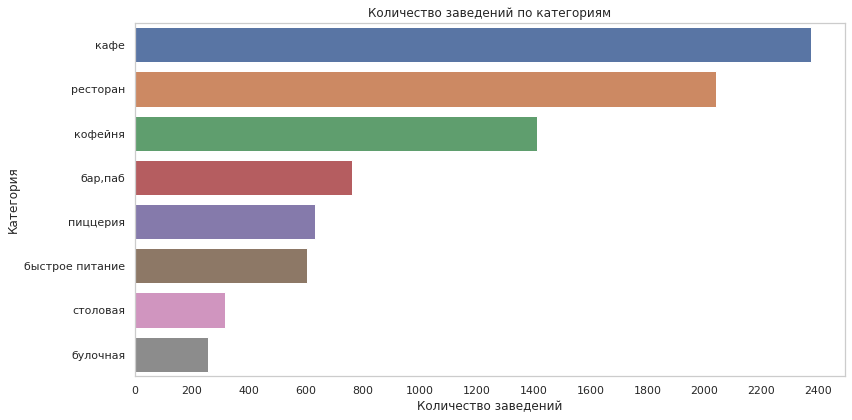

In [ ]:
#построим barplot
plt.figure(figsize=(12, 6))
sns.barplot(data=category_counts, y='category', x='count', order=category_counts['category'])
plt.title('Количество заведений по категориям')
plt.xlabel('Количество заведений')
plt.ylabel('Категория')
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.xticks(np.arange(0, 2500, 200))
plt.tight_layout()
plt.show()

Ключевое наблюдение:

Наибольшее количество заведений приходится на категории "кафе" и "рестораны". Они значительно опережают другие категории, что указывает на их популярность в Москве.

Дополнительные факторы:

Категории "кофейни", "бары/пабы" и "пиццерии" также занимают заметную долю, но их количество меньше, чем у лидеров.

Меньшие категории:

"Столовые" и "булочные" представлены наименьшим количеством заведений, что может говорить об их более узкой специализации или меньшей популярности в данных.

**Вывод:**
Доминирование кафе и ресторанов указывает на то, что эти форматы заведений наиболее востребованы у жителей и гостей Москвы.

### Изучаем количество посадочных мест в заведениях

В этом пункте мы будем исследовать количество посадочных мест в заведениях разных категорий, таких как рестораны, кофейни, пиццерии и бары. Это поможет понять, какие типы заведений рассчитаны на большое количество гостей, а какие — на небольшие группы.

Важно учитывать, что в данных есть более 40% пропусков по этому параметру, что может повлиять на полноту анализа

Для начала построим график "ящик у усами" для понимания общей ситуации по категориям и посмотрим на количество выбросов:

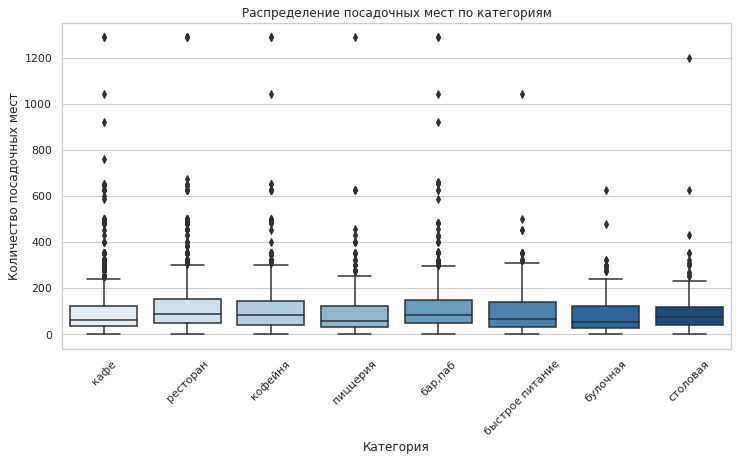

In [ ]:
#построим boxplot для распределения посадочных мест по категориям
plt.figure(figsize=(12, 6))
sns.boxplot(data=places, x='category', y='seats', palette='Blues')
plt.title('Распределение посадочных мест по категориям')
plt.xlabel('Категория')
plt.ylabel('Количество посадочных мест')
plt.xticks(rotation=45)
plt.show()

На графике видно значительное количество выбросов в разных категориях заведений. Особенно примечательны кофейни и пиццерии с более чем 1000 посадочных мест. На данном этапе мы не будем удалять строки с выбросами или возможными ошибками, так как они могут отражать реальные особенности. Вместо этого сосредоточимся на медианном значении посадочных мест для каждой категории, поскольку именно оно представляет наибольший интерес при планировании открытия собственного заведения.

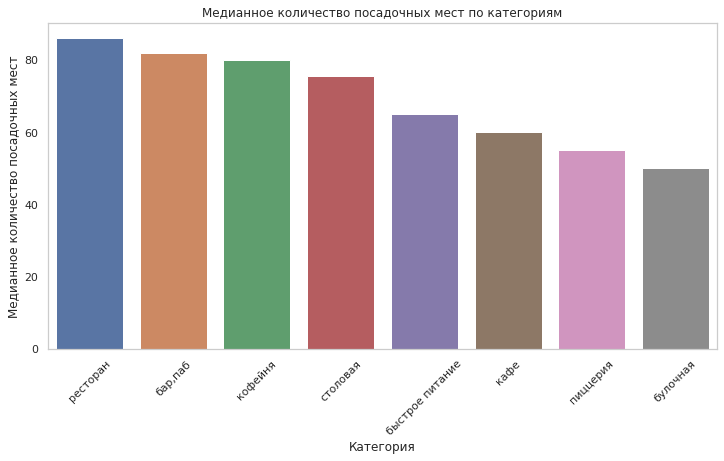

In [ ]:
#рассчитаем медиану количества мест для каждой категории
median_seats = places.groupby('category')['seats'].median().reset_index()
median_seats = median_seats.sort_values(by='seats', ascending=False)

#построим столбчатую диаграмму
plt.figure(figsize=(12, 6))
sns.barplot(data=median_seats, x='category', y='seats')
plt.title('Медианное количество посадочных мест по категориям')
plt.xlabel('Категория')
plt.ylabel('Медианное количество посадочных мест')
plt.xticks(rotation=45)

# Добавим сетку
plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.show()

Рестораны и бары/пабы имеют самые высокие медианные значения посадочных мест (около 80 мест), что отражает их более крупный формат.
Кофейни, столовые и заведения быстрого питания имеют схожие медианные значения, около 60 мест.
Кафе, пиццерии и булочные — наименее вместительные категории с медианным количеством мест около 40–50.

Учет пропусков:
Важно учитывать, что около 40% данных по количеству посадочных мест отсутствует. Это может влиять на полноту анализа и немного смещать общую картину.

**Вывод:**

Категории заведений с большим количеством посадочных мест (рестораны и бары/пабы) чаще предназначены для более массового обслуживания.
Меньшие категории, такие как булочные и пиццерии, рассчитаны на небольшие группы посетителей.
Разброс значений по категориям указывает на разнообразие форматов заведений, что стоит учитывать при планировании нового бизнеса.


### Отношение сетевых и несетевых заведений

В этом этапе мы будем исследовать соотношение сетевых и несетевых заведений. Это поможет понять, какие из них преобладают в Москве и как их доли распределяются в общей структуре заведений.

In [ ]:
#подсчитываем соотношение сетевых и несетевых заведений
chain_counts = places['chain'].value_counts()
chain_labels = ['Несетевые', 'Сетевые']  # 0 = несетевые, 1 = сетевые
chain_counts

0    5199
1    3203
Name: chain, dtype: int64

Построим круговую диаграмму, для лучшеф визуализации результатов:

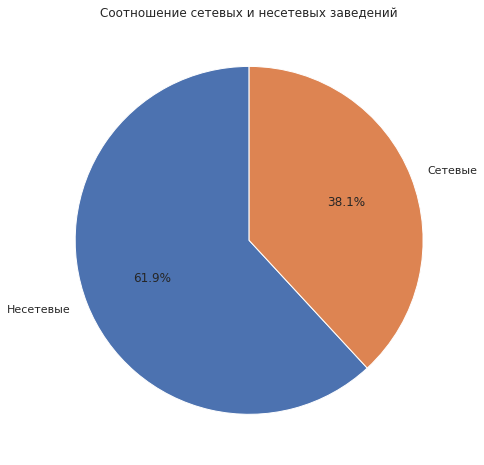

In [ ]:
#построение круговой диаграммы
plt.figure(figsize=(8, 8))
plt.pie(chain_counts, labels=chain_labels, autopct='%1.1f%%', startangle=90)
plt.title('Соотношение сетевых и несетевых заведений')
plt.show()

**Вывод:**

Несетевые заведения доминируют: На долю несетевых заведений приходится 61.9% всех объектов, что свидетельствует о преобладании индивидуальных проектов на рынке Москвы.

Сетевые заведения: Сетевые заведения составляют 38.1%, что указывает на значительное, но менее выраженное присутствие крупных сетей.


### Распределение сетевых заведений по категориям

На этом этапе мы проанализируем, какие категории заведений чаще всего являются сетевыми. Это позволит выявить типы заведений, которые предпочитают масштабироваться, и сделать выводы об их популярности и особенностях.

Выделим в отдельный датафрейм сетевые заведения и рассчитаем их количество по категориям:

In [ ]:
#группируем сетевые заведения по категориям
chain_places = places[places['chain'] == 1]
chain_places = chain_places['category'].value_counts().reset_index()
chain_places.columns = ['category', 'count']
chain_places = chain_places.sort_values(by='count', ascending=False)
chain_places

,category,count
0,кафе,779
1,ресторан,729
2,кофейня,720
3,пиццерия,330
4,быстрое питание,232
5,"бар,паб",168
6,булочная,157
7,столовая,88


Для начала рассчитаем общее количество сетевых заведений для каждой категории в абсолютных значенияъ:

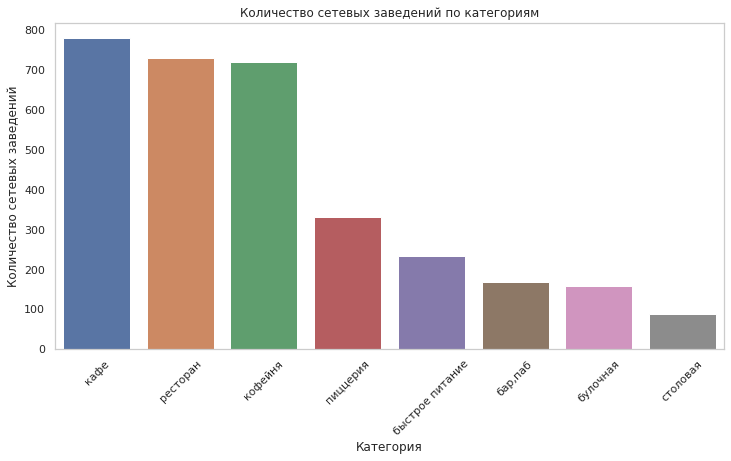

In [ ]:
#построим столбчатую диаграмму для количества сетевых заведений по категориям
plt.figure(figsize=(12, 6))

sns.barplot(data=chain_places, x='category', y='count')
plt.title('Количество сетевых заведений по категориям')
plt.xlabel('Категория')
plt.ylabel('Количество сетевых заведений')
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

Однако, исходя из предыдущего анализа, мы знаем, что кафе и рестораны в целом преобладают среди всех заведений, поэтому их сетевых представителей также больше. Для более точного понимания лучше рассчитать долю сетевых заведений в каждой категории относительно их общего количества.

In [ ]:
#рассчитаем общее количество заведений в каждой категории
total_places = places['category'].value_counts()
chain_places = places[places['chain'] == 1]['category'].value_counts()
#найдем долю сетевых заведений
chain_ratios = (chain_places / total_places).reset_index()
chain_ratios.columns = ['category', 'ratio']
chain_ratios = chain_ratios.sort_values(by='ratio', ascending=False)

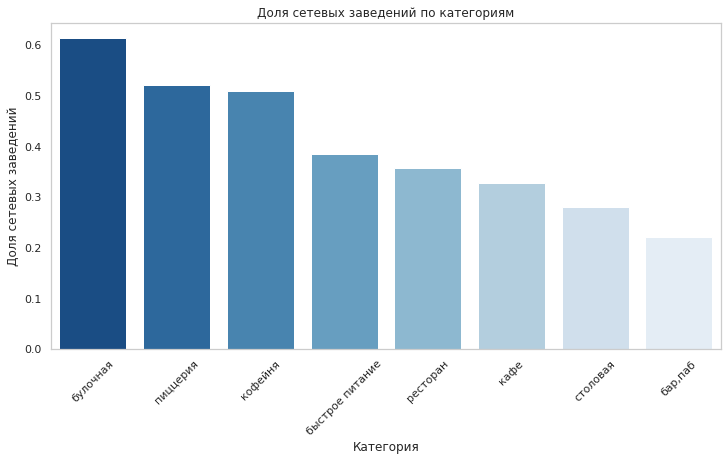

In [ ]:
#построим столбчатую диаграмму для долей сетевых заведений
plt.figure(figsize=(12, 6))

sns.barplot(data=chain_ratios, x='category', y='ratio', palette='Blues_r')
plt.title('Доля сетевых заведений по категориям')
plt.xlabel('Категория')
plt.ylabel('Доля сетевых заведений')
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

Количество сетевых заведений по категориям:
Категории с наибольшим количеством сетевых заведений: кафе, рестораны и кофейни. Эти категории доминируют в абсолютных значениях, что логично, учитывая их популярность на рынке.
Заведения категории булочные, столовые и бары/пабы имеют наименьшее количество сетевых объектов.
Доля сетевых заведений по категориям:
Лидеры изменились: теперь кофейни и пиццерии занимают первые позиции по доле сетевых заведений. Это указывает на то, что большинство заведений этих категорий принадлежат сетям, что отражает их формат бизнеса.
Категории столовые, булочные и рестораны имеют самые низкие доли сетевых заведений, что свидетельствует о большем количестве независимых объектов в этих категориях.

**Вывод:**

Абсолютные значения показывают, что кафе и рестораны наиболее распространены как сетевые заведения, но это связано с их общим количеством.
Доли выявляют категории, где сети доминируют в структуре рынка (например, кофейни и пиццерии). Эти категории можно рассматривать как более стандартизированные и популярные среди сетевых форматов.

### Топ сетевых заведений Москвы

В этом анализе мы будем изучать популярные сети заведений Москвы, чтобы выявить лидеров по количеству точек. Мы сгруппируем данные по названиям и определим топ-15 сетей с наибольшим числом заведений. Это поможет понять, какие сети наиболее распространены, к каким категориям они относятся и есть ли у них общие особенности. Дополнительно визуализируем результаты для наглядности.

In [ ]:
chain_places_top = places[places['chain'] == 1]

In [ ]:
#группируем по названию и считаем количество
popular_chain_places = (
    chain_places_top.groupby(['name', 'category'])
    .size()
    .reset_index(name='count')
    .sort_values(by='count', ascending=False)
    .head(15)
)
popular_chain_places

,name,category,count
1126,шоколадница,кофейня,119
496,домино'с пицца,пиццерия,76
489,додо пицца,пиццерия,74
205,one price coffee,кофейня,71
1142,яндекс лавка,ресторан,69
72,cofix,кофейня,65
241,prime,ресторан,49
617,кофепорт,кофейня,42
632,кулинарная лавка братьев караваевых,кафе,39
963,теремок,ресторан,36


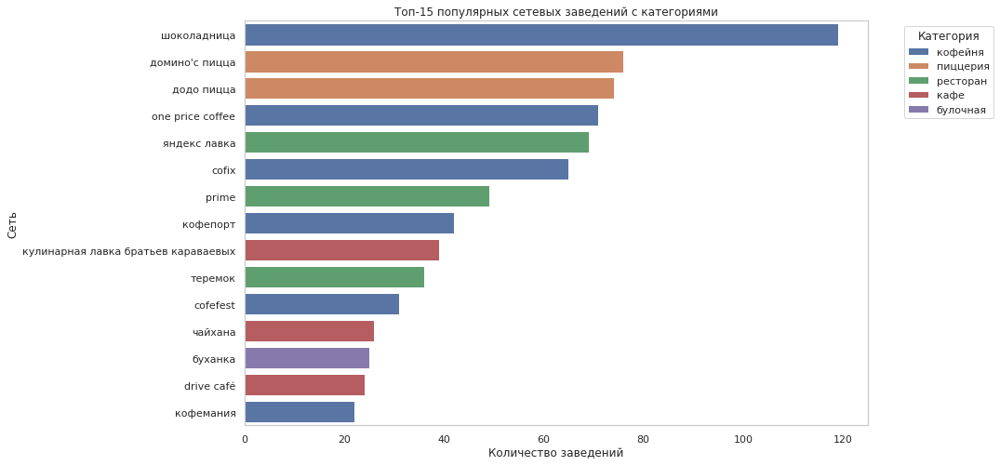

In [ ]:
#построение графика
plt.figure(figsize=(12, 8))
sns.barplot(
    data=popular_chain_places,
    y='name',
    x='count',
    hue='category',
    dodge=False,
)
plt.title('Топ-15 популярных сетевых заведений с категориями')
plt.xlabel('Количество заведений')
plt.ylabel('Сеть')
plt.grid(axis='x', linestyle='--', alpha=0.7)

plt.legend(title='Категория', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()


1. Ключевые лидеры среди сетей:

Сеть Шоколадница занимает первое место по количеству заведений, что подчеркивает популярность кофеен в Москве.
Второе и третье места занимают Домино'с Пицца и Додо Пицца, что говорит о большом спросе на доставку пиццы и удобство их сетевого формата.
2. Популярные категории:

Кофейни занимают значительную часть топ-15 сетей. Их формат, предлагающий кофе навынос и небольшой ассортимент выпечки, особенно востребован среди жителей Москвы.
Пиццерии также популярны. Расположение заведений обычно выбирается таким образом, чтобы удобно обслуживать доставку в пределах района.
3. Особые примечания:

Я лично знакома со всеми представленными заведениями, кроме CofeFest и Drive Café, поэтому хотелось бы добавить пару замечаний, не видных на графике:
Яндекс Лавка не является рестораном в традиционном смысле. Это пункт выдачи заказов и скорее относится к категории магазинов или логистических точек. Вероятно, эта категория попала в список из-за ошибок в данных.
Сеть Чайхана вызывает сомнения. Возможно, в эту категорию объединились все заведения, принадлежащие разным брендам, но относящиеся к одному стилю (восточная кухня).

**Вывод:**

Основу топ-15 сетей составляют заведения, ориентированные на стандартизацию сервиса и удобство (например, кофе навынос, доставка пиццы или доступная еда). Меньше всего представлено сетей, относящихся к уникальным кухням или сложным форматам, что объясняется трудностью масштабирования таких заведений. Формат кофеен, в свою очередь, показывает себя как удачный и востребованный среди людей, что делает его перспективным для открытия новых точек.

### Распределение заведений по районам

Для следующего анализа мы изучим, как заведения распределяются по административным районам Москвы. Мы отобразим общее количество заведений в каждом районе, а также их распределение по категориям. Это позволит понять, какие районы наиболее насыщены заведениями общественного питания и какие категории заведений там преобладают.

In [ ]:
#посчитаем количество заведений по районам
places['district'].value_counts()

Центральный административный округ         2242
Северный административный округ             898
Южный административный округ                892
Северо-Восточный административный округ     890
Западный административный округ             850
Восточный административный округ            798
Юго-Восточный административный округ        714
Юго-Западный административный округ         709
Северо-Западный административный округ      409
Name: district, dtype: int64

Количество заведений в Центральном административном округе Москвы явно превышает их число в других районах, что подчеркивает насыщенность центра города заведениями общественного питания. Чтобы более детально проанализировать распределение категорий заведений по районам и выявить возможные особенности, целесообразно использовать тепловую карту. Такой подход наглядно показывает, какие категории преобладают в каждом районе, позволяя выявить зоны с потенциальным перенасыщением или недостатком определенных типов заведений

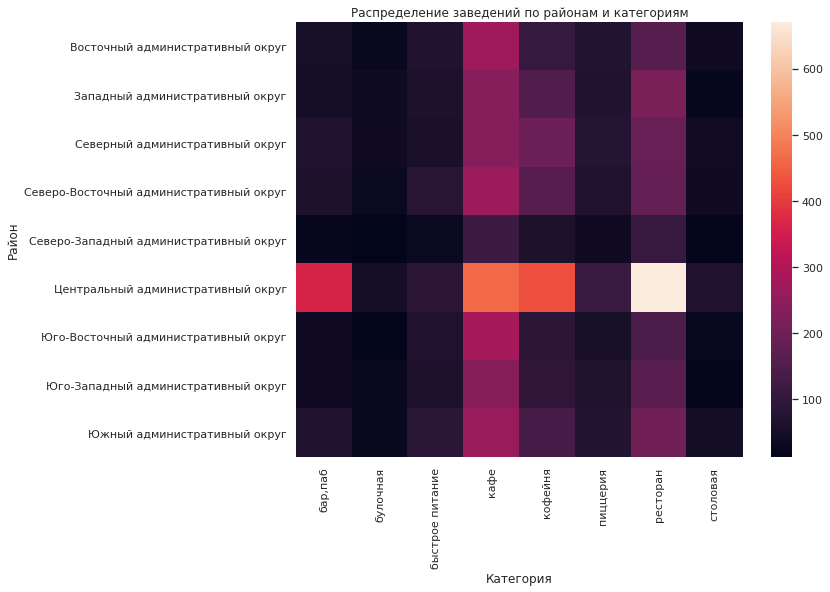

In [ ]:
#создаем сводную таблицу
grouped_data = places.pivot_table(
    index='district',
    columns='category',
    values='name',
    aggfunc='count',
    fill_value=0
)

#построение тепловой карты
plt.figure(figsize=(10, 8))
sns.heatmap(heatmap_data, annot=False, fmt="d", cbar=True)
plt.title('Распределение заведений по районам и категориям')
plt.xlabel('Категория')
plt.ylabel('Район')

plt.show()

Дополнительно для лучшей наглядности распределения количества заведений по категориям и районам построим график с накоплением:

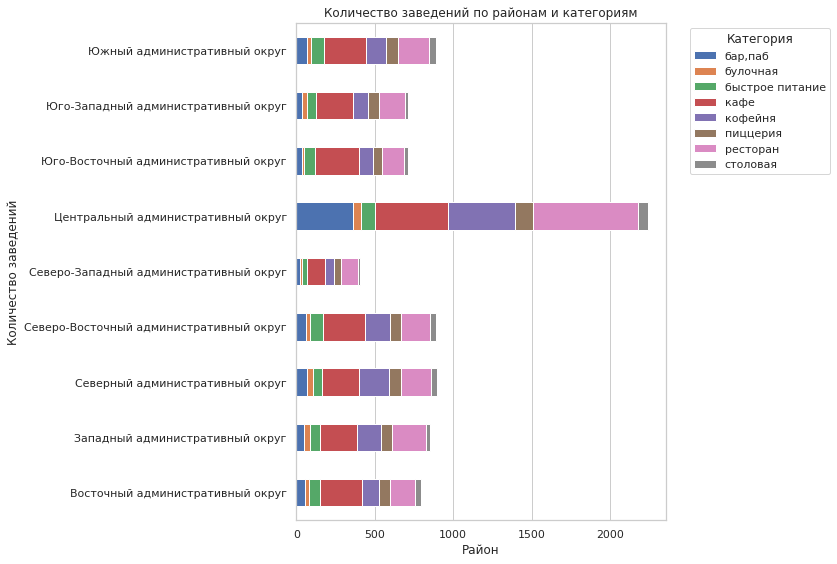

In [ ]:
#построение графика с накоплением
grouped_data.plot(
    kind='barh',
    stacked=True,
    figsize=(12, 8)
)

plt.title('Количество заведений по районам и категориям')
plt.xlabel('Район')
plt.ylabel('Количество заведений')
plt.legend(title='Категория', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()



1. Доминирование центрального округа:
Центральный административный округ значительно выделяется, имея самое большое количество заведений. На графике с накоплением видно, что рестораны и кафе составляют основную часть заведений этого района. Высокая плотность населения, туристическая привлекательность и деловая активность делают центральный округ лидером в сфере общепита. Однако на тепловой карте это доминирование несколько "затемняет" данные по остальным районам, что требует дополнительного внимания к деталям.

2. Популярные категории:
Кафе — самая популярная категория, присутствующая во всех районах Москвы. Рестораны занимают второе место, с особенно высокой концентрацией в центральном районе. Кофейни — третья по популярности категория, что отражает высокий интерес москвичей к формату кофеен.

3. Менее популярные категории:
Булочные и столовые представлены в меньшем количестве во всех районах. Этот факт можно объяснить их специфической нишевой направленностью и меньшим спросом на эти форматы.

4. Особенности категории "Бары/пабы":
Категория баров и пабов демонстрирует высокую концентрацию в некоторых районах, что может объясняться популярностью этих зон среди молодежи. В других районах их количество значительно ниже.

**Вывод:**

Доля заведений в центральном округе значительно превышает показатели остальных районов. Это подчеркивает разницу в плотности заведений между центром и другими частями города. На периферии (в восточных и южных районах) количество заведений заметно меньше, что может быть связано с меньшей плотностью населения или экономической активностью в этих зонах. График с накоплением позволяет более точно оценить распределение категорий заведений по районам, делая его наглядным и информативным.

### Распределение средних рейтингов по категориям

В этом задании мы будем изучать распределение средних рейтингов по различным категориям заведений общественного питания. Наша цель — выяснить, есть ли значительные различия в оценках пользователей для разных типов заведений, таких как рестораны, кофейни или столовые. Это поможет понять, какие категории пользуются наибольшим доверием и популярностью у посетителей, а также выявить потенциальные слабые места в уровне обслуживания или качестве предоставляемых услуг.

Для визуализации распределения рейтингов по категориям заведений мы будем использовать виолончельный график. Этот тип графика отлично подходит, так как он не только показывает медиану и разброс данных, но и наглядно отображает плотность распределения значений. Таким образом, мы сможем увидеть, как именно распределены рейтинги внутри каждой категории и какие различия существуют между ними.

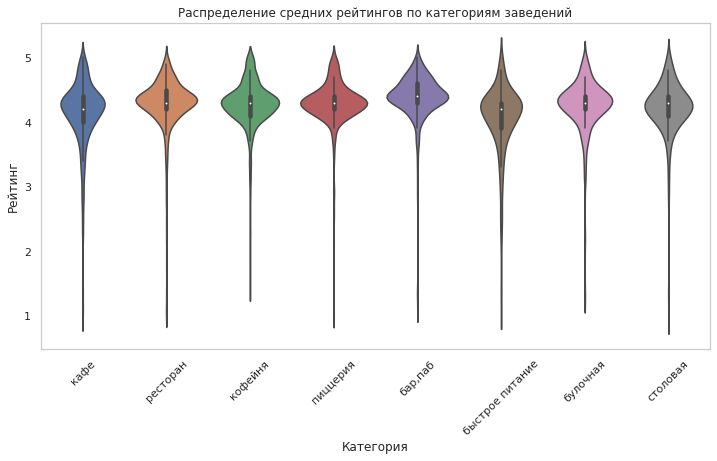

In [ ]:
#построим виолончельный график
plt.figure(figsize=(12, 6))

sns.violinplot(data=places, x='category', y='rating', palette='deep')
plt.title('Распределение средних рейтингов по категориям заведений')
plt.xlabel('Категория')
plt.ylabel('Рейтинг')
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

Усреднённые рейтинги в разных типах общепита не сильно различаются. Большинство категорий имеют медианные значения рейтингов около 4.0–4.5, что указывает на стабильное качество обслуживания и довольство посетителей.
Лидеры по рейтингу:

Рестораны и кафе демонстрируют высокие и стабильные медианные значения, что делает их лидерами по общему восприятию клиентами.
Кофейни также находятся среди категорий с высокими оценками, что может объясняться их популярностью и стандартами качества
Категории с большими разбросами:

Бары/пабы имеют наибольший разброс в оценках, включая большое количество заведений с низкими рейтингами. Это может быть связано с вариативностью в качестве обслуживания и аудитории.
У быстрого питания также отмечается заметный разброс, что может отражать разные уровни качества между сетевыми и несетевыми точками.

**Вывод:**

В целом, рейтинги категорий общественного питания в Москве достаточно близки друг к другу, что свидетельствует о сравнительно высоком уровне качества заведений.


### Средний рейтинг заведений по районам

В этом задании мы будем строить фоновую картограмму, чтобы визуализировать средние рейтинги заведений в разных районах Москвы. Такой подход поможет наглядно оценить различия между районами и выявить, в каких из них заведения получают более высокие оценки от посетителей.

Для начала загрузим файл, содержащий информацию о границах районов Москвы:

In [ ]:
#загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'

Далее расчитаем средний рейтинг всех заведений в районе:

In [ ]:
#рассчитаем средний рейтинг по районам
rating_by_district = places.groupby('district')['rating'].mean().reset_index()
rating_by_district

,district,rating
0,Восточный административный округ,4.174185
1,Западный административный округ,4.181647
2,Северный административный округ,4.240980
3,Северо-Восточный административный округ,4.147978
4,Северо-Западный административный округ,4.208802
5,Центральный административный округ,4.377520
6,Юго-Восточный административный округ,4.101120
7,Юго-Западный административный округ,4.172920
8,Южный административный округ,4.184417


Мы будем использовать хороплет для визуализации, так как он позволяет наглядно отобразить различия в средних рейтингах заведений по районам Москвы. Это поможет быстро оценить, где находятся районы с более высокими или низкими оценками, и сравнить их между собой на географической карте.

In [ ]:
#moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423
#создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')
#создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_by_district,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='Blues',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

#выводим карту
m

**Вывод:**

Центральный административный округ имеет самый высокий средний рейтинг заведений — 4.38, что может быть связано с высокой конкуренцией и качеством обслуживания в центре Москвы.

Юго-Восточный административный округ показывает самый низкий средний рейтинг — 4.10, что может указывать на меньшую плотность премиальных заведений или особенности аудитории.

В целом, средние рейтинги в районах Москвы близки друг к другу и варьируются в пределах 4.10–4.38, что свидетельствует о стабильном уровне качества заведений в городе.

Центральные и северные округа выделяются более высокими рейтингами, в то время как южные и восточные округа находятся ближе к нижнему диапазону.



### Отображение заведений на карте

На той же карте отобразим все заведения из датасета, используя информацию о широте и долготе. Добавим точки используя метод кластеров:

In [ ]:
#создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

#пишем функцию, которая принимает строку датафрейма,
#создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

#применяем функцию create_clusters() к каждой строке датафрейма
places.apply(create_clusters, axis=1)

#выводим карту
m

**Вывод:**

Заведения общественного питания сосредоточены преимущественно в Центральном административном округе, где плотность точек максимальная.
В остальных округах заведения распределены более равномерно, с меньшей плотностью в восточных и юго-восточных частях города.
Карта наглядно демонстрирует, что центр Москвы остаётся ключевой зоной для бизнеса в этой сфере.

### Топ-15 улиц по количеству заведений

В этом задании мы будем анализировать улицы с наибольшим количеством заведений общественного питания. Наша цель — определить топ-15 улиц по числу объектов и изучить, какие категории заведений на них представлены. Для наглядности создадим график, который покажет распределение категорий заведений на этих улицах.

Сгруппируем все заведения в зависимости от улицы, на которой оно находится и подсчитаем их количество. Далее выделим топ 15 заведений с наибольшим количеством:

In [ ]:
counts_streets = places.groupby('street').agg({'name': 'count'}).reset_index()
counts_streets.columns = ['street', 'count']

#сортировка по количеству заведений и выбор топ-15 улиц
top_streets = counts_streets.sort_values(by='count', ascending=False).head(15)
top_streets

,street,count
837,проспект мира,183
841,профсоюзная улица,122
834,проспект вернадского,108
533,ленинский проспект,107
531,ленинградский проспект,95
379,дмитровское шоссе,88
461,каширское шоссе,77
304,варшавское шоссе,76
532,ленинградское шоссе,70
610,мкад,65


Далее отберем из общего датафрейма только те заведения, которые относятся к этим улицам и укажем их в количество в разбивке по категориям:

In [ ]:
top_streets_places = places[places['street'].isin(top_streets['street'])]

#группировка по улицам и категориям
street_category = top_streets_places.groupby(['street', 'category']).agg({'name': 'count'}).reset_index()
street_category.columns = ['street', 'category', 'count']
street_category = street_category.sort_values(by='count', ascending=False)

# Сортируем данные по количеству заведений в порядке убывания
street_category_sorted = street_category.groupby('street')['count'].sum().reset_index().sort_values(by='count', ascending=True)
street_category = street_category.set_index('street').loc[street_category_sorted['street']].reset_index()
street_category

,street,category,count
0,пятницкая улица,ресторан,18
1,пятницкая улица,"бар,паб",9
2,пятницкая улица,кафе,7
3,пятницкая улица,кофейня,6
4,пятницкая улица,пиццерия,3
...,...,...,...
106,проспект мира,быстрое питание,21
107,проспект мира,пиццерия,11
108,проспект мира,"бар,паб",11
109,проспект мира,булочная,4


Для визуализации распределения категорий заведений по топ-15 улицам решено использовать библиотеку Plotly. Этот инструмент позволяет создавать интерактивные графики, которые предоставляют больше возможностей для анализа. Например, с помощью Plotly можно навести курсор на столбцы и увидеть точное количество заведений для каждой категории, что делает анализ более удобным и детализированным. Кроме того, интерактивность позволяет пользователям увеличивать масштаб графика, выделять отдельные категории и лучше понимать данные. Такой подход подходит для глубокого анализа и облегчает работу с большими объемами информации.

In [ ]:
#создаем интерактивный график
fig = px.bar(
    street_category,
    x='count',
    y='street',
    color='category',
    title='Распределение категорий заведений по топ-15 улицам',
    labels={'street': 'Улица', 'count': 'Количество заведений', 'category': 'Категория'},
    barmode='stack'
)

#настраиваем подписи осей и отображение
fig.update_layout(
    xaxis_title='Количество заведений',
    yaxis_title='Улица',
    legend_title='Категория',
    title_font_size=16,
    legend=dict(x=1.05, y=1),
    margin=dict(l=0, r=0, t=50, b=0)
)

fig.show()

1. Распределение категорий:

На графике видно, что кафе и рестораны остаются лидерами среди категорий на всех представленных улицах, что подтверждает их популярность у москвичей. Кофейни занимают третье место по численности, особенно заметны на улицах с высоким пешеходным трафиком, таких как проспект Мира или Ленинградский проспект. Булочные и столовые встречаются крайне редко, что может быть связано с их нишевостью или меньшим спросом на такие заведения.

1. Примечания по выборке:

Мы рассмотрели данные по всем улицам, поэтому в топ-15 вошли как центральные улицы (проспект Мира, Ленинский проспект), так и крупные транспортные магистрали (МКАД, Дмитровское шоссе). Несмотря на то, что некоторые из них больше ориентированы на автомобилистов, мы решили оставить их в анализе для полноты картины.

**Вывод**

График получился наглядным и помогает увидеть общее распределение категорий заведений. Также он демонстрирует, что на улицах с более высокой плотностью заведений (например, Ленинский проспект) присутствует больше разнообразия в категориях, в то время как менее загруженные улицы (например, МКАД) показывают ограниченный выбор форматов заведений.

### Выбор улиц с 1 заведением

В этом задании мы будем искать улицы, на которых расположен только один объект общественного питания. Это поможет понять, чем такие заведения отличаются, и выявить их возможные особенности — например, уникальные форматы или расположение в малонаселённых районах.

Ранее мы считали количество заведений для каждой улицы, сейчас выделим в отдельный список те, на которых находится лишь одно заведение.

In [ ]:
#найдем список улиц
streets_with1 = counts_streets[counts_streets['count'] == 1]
streets_with1

,street,count
0,1-й автозаводский проезд,1
1,1-й балтийский переулок,1
2,1-й варшавский проезд,1
3,1-й вешняковский проезд,1
5,1-й голутвинский переулок,1
...,...,...
1425,электрический переулок,1
1432,юго-западный административный округ,1
1437,якиманский переулок,1
1438,яковоапостольский переулок,1


In [ ]:
#отфильтруем заведения
single_places_streets = places[places['street'].isin(streets_with1['street'])]
single_places_streets

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
15,дом обеда,столовая,"москва, улица бусиновская горка, 2",Северный административный округ,пн-пт 08:30–18:30; сб 10:00–20:00,55.885890,37.493264,4.1,средние,Средний счёт:300–500 ₽,400.0,NaN,0,180.0,улица бусиновская горка,False
21,7/12,кафе,"москва, прибрежный проезд, 7",Северный административный округ,"ежедневно, 10:00–22:00",55.876805,37.464934,4.5,NaN,NaN,NaN,NaN,0,NaN,прибрежный проезд,False
25,в парке вкуснее,кофейня,"москва, парк левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,1,NaN,парк левобережный,False
58,coffeekaldi's,кофейня,"москва, угличская улица, 13, стр. 8",Северо-Восточный административный округ,"ежедневно, 09:00–22:00",55.900316,37.570558,4.1,средние,Средний счёт:500–800 ₽,650.0,NaN,1,NaN,угличская улица,False
60,чебуречная история,кофейня,"москва, ландшафтный заказник лианозовский",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.899845,37.570488,4.9,NaN,NaN,NaN,NaN,1,NaN,ландшафтный заказник лианозовский,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8285,мираж,ресторан,"москва, улица шкулёва, 2а",Юго-Восточный административный округ,"пн-пт 11:00–23:00; сб,вс 11:00–00:00",55.693340,37.746231,4.7,NaN,NaN,NaN,NaN,0,90.0,улица шкулёва,False
8290,wtfcoffee,кофейня,"москва, улица артюхиной, 14/8с1",Юго-Восточный административный округ,"ежедневно, 10:00–22:00",55.699044,37.737790,4.4,средние,NaN,NaN,NaN,0,NaN,улица артюхиной,False
8313,беседка,кафе,"москва, кузьминская улица, 10",Юго-Восточный административный округ,"ежедневно, 11:00–23:00",55.690691,37.787735,4.1,NaN,NaN,NaN,NaN,1,NaN,кузьминская улица,False
8375,лагман хаус,кафе,"москва, новороссийская улица, 14, стр. 2",Юго-Восточный административный округ,"ежедневно, 10:00–00:00",55.678772,37.759422,4.3,NaN,NaN,NaN,NaN,1,40.0,новороссийская улица,False


Получаем 458 улиц Москвы, на которых находится одно заведение питания. Рассмотрим как эти заведения распределены по категориям и районам:

In [ ]:
single_places_streets['category'].value_counts()

кафе               159
ресторан            93
кофейня             84
бар,паб             39
столовая            36
быстрое питание     23
пиццерия            15
булочная             8
Name: category, dtype: int64

In [ ]:
single_places_streets['district'].value_counts()

Центральный административный округ         145
Северо-Восточный административный округ     55
Восточный административный округ            52
Северный административный округ             51
Южный административный округ                43
Юго-Восточный административный округ        39
Западный административный округ             35
Северо-Западный административный округ      19
Юго-Западный административный округ         18
Name: district, dtype: int64

Особенности улиц с одним заведением:
Улицы с одним заведением чаще всего являются небольшими проулками, особенно в Центральном административном округе, где такие улицы встречаются чаще всего (145 заведений). Это объясняется плотной застройкой центра.

Распределение по категориям:
Большинство заведений — кафе (160), рестораны (93) и кофейни (84). Менее популярны пиццерии (15) и булочные (8).

Распределение по районам:
Больше всего таких улиц в Центральном округе (145), меньше всего — в Юго-Западном округе (18).

**Вывод:**
Прямых особенностей таких улиц выявить не удалось, однако можно отметить, что небольших улиц в Москве очень много, особенно в центре. Заведения, расположенные на таких улицах, чаще всего ориентированы на локальный поток клиентов и небольшую аудиторию.

### Медианный счет заведений по районам

В этом задании мы будем исследовать ценовую политику заведений в разных административных округах Москвы.

Цель анализа — рассчитать медиану значений среднего чека для каждого района и использовать её в качестве ценового индикатора. Это поможет выявить различия в стоимости посещения заведений в зависимости от их расположения. Мы также рассмотрим, как удалённость от центра города влияет на ценовой уровень.

Для начала устраним пропуски в столбце middle_avg_bill, чтобы корректно рассчитать медиану. Стоит отметить, что более 60% значений в этом столбце отсутствуют, поэтому полученные данные следует воспринимать как ориентировочные и с определённой долей условности.

In [ ]:
#удаляем строки с пропусками
filtered_places = places.dropna(subset=['middle_avg_bill'])

#группируем данные по районам и рассчитываем медиану среднего чека
median_avg_bill_by_district = (
    filtered_places.groupby('district')['middle_avg_bill'].median().reset_index()
)
median_avg_bill_by_district.columns = ['district', 'median_avg_bill']
median_avg_bill_by_district = median_avg_bill_by_district.sort_values(by='median_avg_bill', ascending=False)
median_avg_bill_by_district

,district,median_avg_bill
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,575.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,450.0


Для наглядности построим хороплет, который позволит визуализировать ценовые различия между районами и сделать выводы о том, в каких частях Москвы средний чек выше или ниже.

In [ ]:
#создаём карту Москвы
m2 = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')
#добавляем хороплет
Choropleth(
    geo_data=state_geo,
    data=median_avg_bill_by_district,
    columns=['district', 'median_avg_bill'],
    key_on='feature.name',
    fill_color='BuPu',
    fill_opacity=0.8,
    line_opacity=0.2,
    legend_name='Медианный средний чек по районам (₽)'
).add_to(m2)

#сохраняем карту в файл или выводим
m2.save('median_avg_bill_map.html')
m2

Центральный административный округ выделяется самой высокой медианой среднего чека (около 1000₽). Это ожидаемо, поскольку центр Москвы славится дорогими заведениями и высокой арендной стоимостью.

В округах, отдалённых от центра (например, Юго-Восточный и Восточный административные округа), медиана среднего чека заметно ниже, около 400-500₽.
Северные и западные округа (Северный, Северо-Западный и Западный административные округа) демонстрируют средний чек выше 500₽, что свидетельствует о присутствии заведений среднего сегмента.

В южных районах (Южный, Юго-Западный округа) медианный чек ближе к 700₽, что выше среднего для окраин.

Влияние удалённости от центра Москвы на средний чек очевидно: чем ближе к центру, тем выше стоимость.

Примечание:
Поскольку столбец middle_avg_bill содержит более 60% пропусков, построенная карта основывается на ограниченном количестве данных. Это значит, что выводы носят условный характер и требуют дальнейшего уточнения при наличии более полной информации.

**Вывод:**
Центральный административный округ лидирует по стоимости среднего чека, что отражает премиальность заведений в этом районе. Отдалённые округа предлагают более доступные цены, ориентируясь на локальных жителей. Южные и западные округа занимают промежуточное положение, демонстрируя развитие заведений среднего сегмента.



### Вывод по исследовательскому анализу

В ходе исследования были проделаны следующие шаги:

1. Анализ категорий заведений: Основное распределение объектов общественного питания по категориям показало, что кафе и рестораны доминируют, а кофейни занимают третье место.
Такие категории, как столовые и булочные, встречаются реже, что говорит об их меньшей популярности или нишевости.

2. Посадочные места: Среднее количество посадочных мест сильно варьируется между категориями. Наибольшее количество посадочных мест характерно для ресторанов, в то время как кофейни и пиццерии чаще имеют компактные залы.
Мы учли выбросы, но фокусировались на медианах, чтобы понять, на какие значения ориентироваться при открытии заведения.

3. Соотношение сетевых и несетевых заведений: Несетевые заведения преобладают в датасете, но кафе и рестораны чаще представлены в формате сетей.
Сетевые заведения имеют явное преимущество в популярных категориях, таких как кофейни и пиццерии.
4. Топ-15 сетей: В топ-15 популярных сетей Москвы входят в основном кофейни и пиццерии. Это подчеркивает спрос на доступные и стандартизированные заведения с удобным форматом обслуживания.
5. Анализ по районам: Центральный административный округ (ЦАО) лидирует как по общему количеству заведений, так и по медианным значениям среднего чека. Это связано с его статусом, высокой покупательной способностью аудитории и плотной застройкой. Отдалённые районы (например, Восточный и Юго-Восточный округа) предлагают более доступные цены, что ориентировано на локальных жителей.
6. Рейтинги заведений: Усреднённые рейтинги не сильно различаются между категориями, но кофейни и рестораны демонстрируют чуть более высокие значения.
Высокие рейтинги коррелируют с качеством обслуживания и популярностью категории.
7. Улицы с единственным заведением: Такие улицы чаще всего находятся в ЦАО, что объясняется наличием небольших проулков. На них преобладают кафе и рестораны.
8. Медиана среднего чека: Медианные значения среднего чека демонстрируют чёткую зависимость от удалённости района от центра Москвы. Чем ближе к центру, тем выше чек.

**Вывод:**

- Популярные категории: Кафе, рестораны и кофейни остаются наиболее востребованными форматами в Москве. Их популярность подтверждается как абсолютным количеством заведений, так и их представленностью в сетях.
- Центр vs окраины: Центральный округ лидирует по числу заведений и уровню среднего чека, но отдалённые районы предоставляют больше возможностей для заведений с демократичными ценами.
- Формат заведений: Сетевые форматы популярны в большинстве категорий, так как они предлагают стандартизацию и удобство.
- Рекомендации: Для успешного открытия нового заведения стоит ориентироваться на востребованные категории (например, кофейни) и учитывать особенности района, включая уровень доходов аудитории и конкуренцию.

## Отрытие кофейни в Москве

В этом разделе мы сосредоточимся на исследовании кофеен Москвы, чтобы помочь основателям фонда «Shut Up and Take My Money» реализовать их мечту — открыть кофейню в стиле «Central Perk» из сериала «Друзья». Мы хотим изучить, насколько это возможно в условиях московского рынка, и найти лучшее место для открытия заведения.

Для этого мы будем анализировать данные о количестве кофеен, их расположении, круглосуточности работы, рейтингах и ценах. Мы также определим, какой район города наиболее перспективен для запуска нового заведения, а на основе анализа стоимости капучино сформулируем рекомендации по ценовой политике.

Цель исследования — не только выявить особенности рынка, но и предложить оптимальные условия для успешного запуска кофейни, учитывая потребности клиентов и текущие тенденции.

#### Анализ всех кофеен

Для начала выделим все кофейни в отдельный датафрейм и посомтрим общую информацию о нем:

In [ ]:
#выделяем категорий "кофейня"
coffee_places = places[places['category'] == 'кофейня'].reset_index(drop=True)
coffee_places.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
0,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица маршала федоренко,False
1,в парке вкуснее,кофейня,"москва, парк левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,1,NaN,парк левобережный,False
2,9 bar coffee,кофейня,"москва, коровинское шоссе, 41, стр. 1",Северный административный округ,пн-пт 08:00–18:00,55.885837,37.513422,4.0,NaN,NaN,NaN,NaN,1,46.0,коровинское шоссе,False
3,cofefest,кофейня,"москва, улица маршала федоренко, 6с1",Северный административный округ,пн-пт 09:00–19:00,55.879934,37.492522,3.6,NaN,NaN,NaN,NaN,1,NaN,улица маршала федоренко,False
4,cofix,кофейня,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 08:00–22:00",55.878531,37.479395,3.8,NaN,NaN,NaN,NaN,1,NaN,улица дыбенко,False


In [ ]:
#изучаем общую информацию
coffee_places.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1413 entries, 0 to 1412
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               1413 non-null   object 
 1   category           1413 non-null   object 
 2   address            1413 non-null   object 
 3   district           1413 non-null   object 
 4   hours              1413 non-null   object 
 5   lat                1413 non-null   float64
 6   lng                1413 non-null   float64
 7   rating             1413 non-null   float64
 8   price              476 non-null    object 
 9   avg_bill           721 non-null    object 
 10  middle_avg_bill    200 non-null    float64
 11  middle_coffee_cup  521 non-null    float64
 12  chain              1413 non-null   int64  
 13  seats              751 non-null    float64
 14  street             1413 non-null   object 
 15  is_24_7            1413 non-null   bool   
dtypes: bool(1), float64(6), 

В датасете представлено 1413 кофеен, что составляет значительную долю от общего числа заведений общественного питания. Это свидетельствует о высокой популярности кофейного формата среди москвичей. Уже на этом этапе можно говорить о высокой конкуренции на рынке кофеен в Москве, что делает выбор места для нового заведения особенно важным.

Найдем общее количество кофеен в каждом из районов Москвы и отметим их на карте:

In [ ]:
#группируем кофейни по районам и подсчитываем их количество
coffee_counts_by_district = coffee_places.groupby('district').agg({'name': 'count'}).reset_index()
coffee_counts_by_district.columns = ['district', 'coffee_count']
coffee_counts_by_district = coffee_counts_by_district.sort_values(by='coffee_count', ascending=False)
coffee_counts_by_district

,district,coffee_count
5,Центральный административный округ,428
2,Северный административный округ,193
3,Северо-Восточный административный округ,159
1,Западный административный округ,150
8,Южный административный округ,131
0,Восточный административный округ,105
7,Юго-Западный административный округ,96
6,Юго-Восточный административный округ,89
4,Северо-Западный административный округ,62


In [ ]:
#создаём карту Москвы
m3 = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

#добавляем границы районов
folium.GeoJson(
    state_geo,
    name="Границы районов",
    style_function=lambda x: {'color': 'black', 'weight': 1, 'fillOpacity': 0.1}
).add_to(m3)

#создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m3)
def create_clusters(row):
    #сохраняем URL-адрес изображения
    icon_url = 'https://img.icons8.com/?size=100&id=109144&format=png&color=000000'
    #создаём объект с собственной иконкой размером 30x30
    icon = CustomIcon(icon_url, icon_size=(30, 30))

    #создаём маркер с иконкой icon и добавляем его в кластер
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
        icon=icon,
    ).add_to(marker_cluster)

#применяем функцию для создания кластеров к каждой строке датафрейма
coffee_places.apply(create_clusters, axis=1)

#выводим карту
m3

Центральный административный округ (ЦАО) лидирует по количеству кофеен — 428 заведений. Это объясняется высокой деловой активностью, плотностью населения и туристической привлекательностью центра Москвы.

Северный и Северо-Восточный административные округа занимают второе и третье места с 193 и 159 кофейнями соответственно. Эти районы, вероятно, также обладают хорошей транспортной доступностью и плотной застройкой.

Западный округ (150 кофеен) и Южный округ (131 кофейня) демонстрируют высокую обеспеченность кофейнями, что указывает на развитую инфраструктуру и востребованность таких заведений.

Восточный и Юго-Западный округа имеют схожее количество кофеен — 105 и 96 соответственно. Это немного ниже, но всё ещё показывает стабильное присутствие кофеен.

Юго-Восточный округ и Северо-Западный округ замыкают список с 89 и 62 заведениями. Это может быть связано с меньшей коммерческой активностью или более низкой плотностью населения.

**Вывод:**
Карта подтверждает, что плотность кофеен в Москве значительно выше в центре города и постепенно снижается по мере удаления от центра. Это логично, учитывая, что центральные районы являются основными точками притяжения как для местных жителей, так и для туристов.

Далее рассчитаем средний рейтинг кофеен по районам и отобразим на карте при помощи хроноплета:

In [ ]:
coffee_rating = coffee_places.groupby('district')['rating'].mean().reset_index()
coffee_rating.columns = ['district', 'rating']
coffee_rating = coffee_rating.sort_values(by='rating', ascending=False)
coffee_rating

,district,rating
5,Центральный административный округ,4.336449
4,Северо-Западный административный округ,4.325806
2,Северный административный округ,4.291710
7,Юго-Западный административный округ,4.283333
0,Восточный административный округ,4.282857
8,Южный административный округ,4.232824
6,Юго-Восточный административный округ,4.225843
3,Северо-Восточный административный округ,4.216981
1,Западный административный округ,4.195333


In [ ]:
#создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=coffee_rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='Purples',
    fill_opacity=0.8,
    legend_name='Средний рейтинг кофеен по районам',
).add_to(m3)

#выводим карту
m3

На карте видно, что самый высокий средний рейтинг кофеен наблюдается в Центральном административном округе (4.34). Это ожидаемо, поскольку центр Москвы привлекает как местных жителей, так и туристов, что мотивирует владельцев поддерживать высокий уровень сервиса.

В Северо-Западном и Северо-Восточном округах также наблюдаются высокие средние рейтинги, что делает эти районы привлекательными для открытия новых заведений. В отдалённых округах, таких как Юго-Восточный и Восточный, средние рейтинги немного ниже (около 4.2).

Чтобы сделать более точные выводы и выбрать наиболее перспективный район для открытия кофейни, нужно рассмотреть отношение среднего рейтинга к количеству кофеен.

In [ ]:
#группируем данные по районам
coffee_districts = coffee_places.groupby('district').agg({
    'rating': 'mean',
    'name': 'count'
}).reset_index()

coffee_districts.columns = ['district', 'rating', 'coffee_count']

#рассчитаем отношение среднего рейтинга к количеству кофеен
coffee_districts['rating_to_count'] = coffee_districts['rating'] / coffee_districts['coffee_count']
coffee_districts.sort_values(by='rating_to_count', ascending=False, inplace=True)
coffee_districts

,district,rating,coffee_count,rating_to_count
4,Северо-Западный административный округ,4.325806,62,0.069771
6,Юго-Восточный административный округ,4.225843,89,0.047481
7,Юго-Западный административный округ,4.283333,96,0.044618
0,Восточный административный округ,4.282857,105,0.040789
8,Южный административный округ,4.232824,131,0.032312
1,Западный административный округ,4.195333,150,0.027969
3,Северо-Восточный административный округ,4.216981,159,0.026522
2,Северный административный округ,4.291710,193,0.022237
5,Центральный административный округ,4.336449,428,0.010132


Выведем результаты на графике:

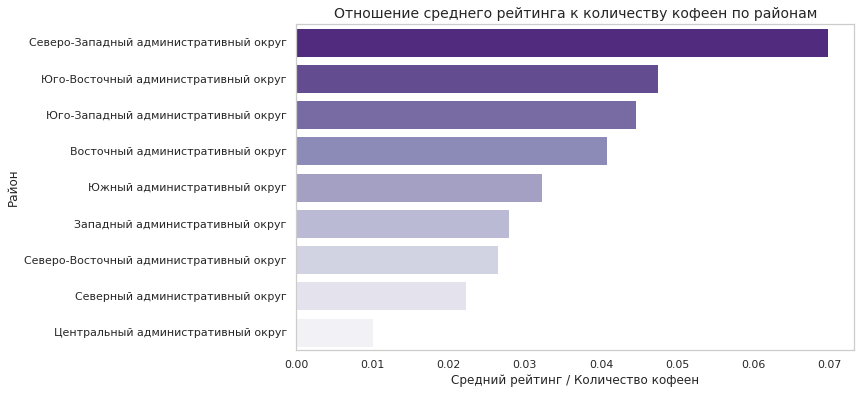

In [ ]:
plt.figure(figsize=(10, 6))
#построение горизонтальной столбчатой диаграммы
sns.barplot(
    y='district',
    x='rating_to_count',
    data=coffee_districts.sort_values(by='rating_to_count', ascending=False),
    palette='Purples_r'
)
plt.title('Отношение среднего рейтинга к количеству кофеен по районам', fontsize=14)
plt.xlabel('Средний рейтинг / Количество кофеен', fontsize=12)
plt.ylabel('Район', fontsize=12)
plt.grid(axis='x')
plt.show()

**Вывод:**

Северо-Западный административный округ имеет самый высокий коэффициент соотношений среднего рейтинга кофеен к их количеству. Это указывает на низкую конкуренцию в районе при хорошем качестве существующих заведений.

Центральный административный округ имеет низкое значение на графике из-за высокой насыщенности кофейнями, что делает его менее привлекательным для новых открытий.

В районах с невысокими показателями, таких как Южный или Юго-Восточный административные округа, конкуренция может быть меньше, но средние рейтинги кофеен там относительно ниже.

*Рекомендация:* Присмотреться к Северо-Западному административному округу как перспективному району для открытия кофейни. Полученный график подтверждает данные, которые мы видели на карте выше. Низкая конкуренция и высокие рейтинги существующих заведений делают его привлекательным для запуска нового проекта.

Далее построим боксплот диаграмму, чтобы понять, есть ли разница в рейтингах между сетевыми и несетевыми кофейнями, а также как это различие проявляется в разных районах.

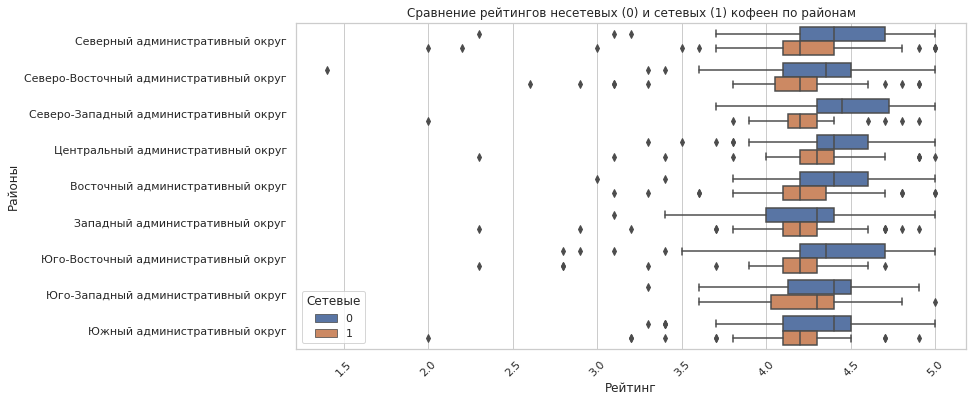

In [ ]:
plt.figure(figsize=(12, 6))

sns.boxplot(data=coffee_places, x='rating', y='district', hue='chain')
plt.xticks(rotation=45)
plt.title('Сравнение рейтингов несетевых (0) и сетевых (1) кофеен по районам')
plt.xlabel('Рейтинг')
plt.ylabel('Районы')
plt.legend(title='Сетевые')
plt.grid(True, axis='x')
plt.show()


- Рейтинги несетевых кофеен в среднем выше, чем у сетевых заведений, во всех административных округах Москвы.
Разброс значений (различие между низкими и высокими рейтингами) также выше у несетевых кофеен.

- Распределение по районам: Центральный административный округ имеет самые высокие медианные рейтинги как у сетевых, так и у несетевых кофеен.
Северо-Западный и Юго-Западный округа показывают стабильные высокие рейтинги для несетевых заведений.

- Особенности сетевых кофеен: Рейтинги сетевых кофеен более сгруппированы вокруг среднего значения, что указывает на стабильное, но менее выдающееся качество обслуживания.

**Вывод:**

Несетевые кофейни предлагают индивидуальный опыт, что может объяснять их более высокие рейтинги.
Для нового заведения в центре Москвы стоит учитывать, что конкуренция высокая, но качественная кофейня с уникальной атмосферой может успешно выделиться на фоне сетевых заведений.

Найдем отношение кругосуочных и некруглосуточных кофеен Москвы.

In [ ]:
#группируем данные
round_the_clock_counts = coffee_places.groupby('is_24_7')['name'].count().reset_index()
round_the_clock_counts.columns = ['is_24_7', 'count']

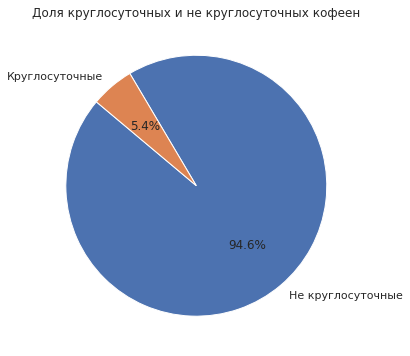

In [ ]:
#построим круговую диаграмму
plt.figure(figsize=(6, 6))
plt.pie(
    round_the_clock_counts['count'],
    labels=['Не круглосуточные', 'Круглосуточные'],
    autopct='%1.1f%%',
    startangle=140
)
plt.title('Доля круглосуточных и не круглосуточных кофеен')
plt.show()

Доля некруглосуточных кофеен значительно превышает долю круглосуточных, что говорит о том, что круглосуточный формат в Москве пока не получил широкого распространения. Это может быть связано с низким спросом на круглосуточные заведения или высокой стоимостью их содержания.

#### Выбор района

**Рекомендация:** открыть кофейню в Северо-Западном административном округе (СЗАО)

На основе проведённого анализа мы рекомендуем открыть кофейню в Северо-Западном административном округе Москвы. Вот ключевые причины выбора этого района:

- Оптимальное отношение рейтинга к количеству кофеен: Северо-Западный округ имеет наилучшее соотношение среднего рейтинга кофеен к их количеству. Это указывает на то, что существующие заведения поддерживают высокий уровень качества, но рынок ещё не перенасыщен, что создаёт хорошие условия для открытия нового заведения.
- Высокий средний рейтинг кофеен: Средний рейтинг кофеен в СЗАО составляет 4.33, что сопоставимо с лидерами, такими как Центральный административный округ, но в СЗАО конкуренция ниже.
- Умеренная конкуренция: В округе расположено 62 кофейни, что является сравнительно низким показателем по сравнению с другими районами (например, ЦАО с 428 заведениями). Это даёт возможность выйти на рынок без избыточного давления конкурентов.
- Привлекательный для жителей формат: В округе наблюдается устойчивый спрос на качественные кофейни, что подтверждается высокой оценкой существующих заведений.
- Возможности для дальнейшего развития: Сравнительно небольшое количество кофеен в СЗАО даёт возможность выделиться за счёт уникального предложения, например, создать атмосферное заведение в стиле "Central Perk" из сериала "Друзья", ориентированное на долгие посиделки и общение.

**Вывод:**

Северо-Западный округ объединяет преимущества высокого рейтинга, достаточного уровня спроса и умеренной конкуренции, что делает его лучшим выбором для запуска кофейни.

Изучим подробнее кофейни Северо-Западного района:

In [ ]:
#выделяем кофейни и смотрим общую информацию
northwest_coffee_places = coffee_places[coffee_places['district'] == 'Северо-Западный административный округ']
northwest_coffee_places.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 62 entries, 39 to 608
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               62 non-null     object 
 1   category           62 non-null     object 
 2   address            62 non-null     object 
 3   district           62 non-null     object 
 4   hours              62 non-null     object 
 5   lat                62 non-null     float64
 6   lng                62 non-null     float64
 7   rating             62 non-null     float64
 8   price              19 non-null     object 
 9   avg_bill           32 non-null     object 
 10  middle_avg_bill    11 non-null     float64
 11  middle_coffee_cup  21 non-null     float64
 12  chain              62 non-null     int64  
 13  seats              34 non-null     float64
 14  street             62 non-null     object 
 15  is_24_7            62 non-null     bool   
dtypes: bool(1), float64(6), in

Разместим кофейни на карте:

In [ ]:
moscow_lat, moscow_lng = 55.751244, 37.618423

#создаём карту СЗАО
map_northwest = Map(location=[moscow_lat, moscow_lng], zoom_start=11, tiles='Cartodb Positron')
marker_cluster = MarkerCluster().add_to(map_northwest)

#добавляем кофейни в кластер на карте
def add_markers(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} - Рейтинг: {row['rating']:.1f}",
    ).add_to(marker_cluster)

northwest_coffee_places.apply(add_markers, axis=1)

map_northwest

Изучим распределение кофеен СЗАО в зависимости от принадлежности к сети:

In [ ]:
northwest_coffee_places['chain'].value_counts()

1    34
0    28
Name: chain, dtype: int64

Анализ распределения кофеен в Северо-Западном административном округе показывает, что 34 из 62 заведений (около 55%) являются сетевыми, в то время как несетевые кофейни составляют 28 заведений (около 45%). Это указывает на относительно сбалансированное присутствие обоих типов заведений.

Однако, учитывая общий тренд более высоких рейтингов у несетевых кофеен, можно предположить, что открытие уникальной и атмосферной несетевой кофейни будет логичным решением. Это позволит выделиться среди сетевых конкурентов, которые уже занимают значительную долю рынка, и привлечь аудиторию, предпочитающую индивидуальность и уникальный опыт.

И в самом конце изучим среднюю стоимость за чашку капучинно в кофейнях Северно-Западного района:

In [ ]:
northwest_coffee_places['middle_coffee_cup'].describe()

count     21.000000
mean     165.523810
std       60.797713
min       60.000000
25%      124.000000
50%      165.000000
75%      200.000000
max      270.000000
Name: middle_coffee_cup, dtype: float64

Из-за большого количества пропусков у нас представлены только менее 30% цен среди всех кофеен района. Однако увидеть тенденцию и сделать некоторые выводы все же можно. Для лучше визуализации построим боксплот диаграмму:

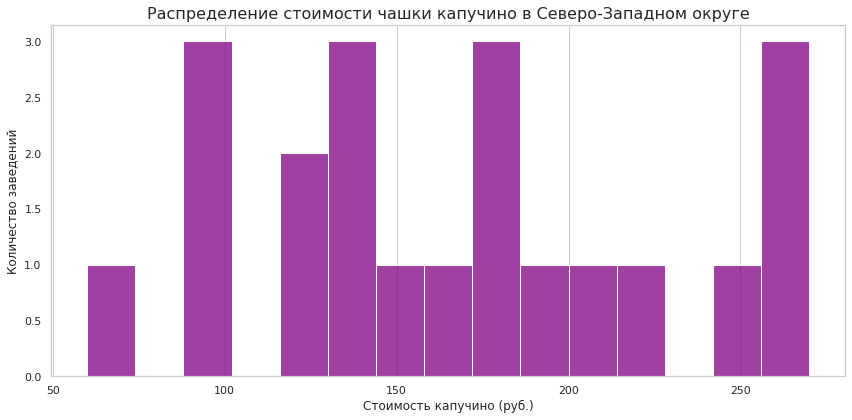

In [ ]:
plt.figure(figsize=(12, 6))
sns.histplot(
    data=coffee_places[coffee_places['district'] == 'Северо-Западный административный округ'],
    x='middle_coffee_cup',
    bins=15,
    kde=False,
    color='purple'
)
plt.title('Распределение стоимости чашки капучино в Северо-Западном округе', fontsize=16)
plt.xlabel('Стоимость капучино (руб.)', fontsize=12)
plt.ylabel('Количество заведений', fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

На графике видно, что стоимость чашки капучино в Северо-Западном округе распределена в диапазоне от 50 до 250 рублей, а медиана составляет около 150 рублей. Исходя из этого, диапазон 150–180 рублей является оптимальным выбором. Он соответствует медианному значению, что делает цену конкурентоспособной, но при этом позволяет привлекать клиентов, ориентированных на качественное, но доступное предложение.

#### Вывод по открытию кофейни

- Количество кофеен и их расположение: В Москве насчитывается 1413 кофеен.
Северо-Западный административный округ выбран в качестве оптимального района для открытия новой кофейни:
Здесь находится 62 кофейни — это умеренное количество по сравнению с другими районами, что оставляет место для конкуренции.
Район имеет высокое соотношение среднего рейтинга к количеству заведений (0.07), что говорит о меньшей конкуренции при хорошем уровне обслуживания.
- Формат заведения: В районе 34 сетевых и 28 несетевых кофеен. Несетевые заведения демонстрируют хороший уровень рейтинга и пользуются спросом.
На основе данных, рекомендуется открыть несетевую кофейню, что позволит выделиться на фоне конкурентов и привлечь аудиторию, ценящую уникальность и атмосферу.
- Круглосуточный формат: Круглосуточные кофейни составляют лишь 10% от всех заведений в районе.
Это может стать конкурентным преимуществом, если кофейня будет ориентирована на аудиторию, нуждающуюся в доступе к напиткам ночью (например, студенты, водители).
- Цены на капучино: Медианная цена чашки капучино составляет 165 рублей, что соответствует рынку и ожиданиям аудитории.
Рекомендуем установить стоимость чашки в диапазоне 150-180 рублей, чтобы быть конкурентоспособным, сохраняя прибыльность.
- Рейтинги кофеен: Средний рейтинг кофеен в районе — 4.32, что выше среднего уровня по Москве. Это подтверждает, что кофейни в районе ориентированы на качество, и новое заведение также должно поддерживать высокий уровень обслуживания.

**Итоговая рекомендация**

Открытие кофейни в Северо-Западном административном округе обосновано на следующих аргументах:

1. Меньшая конкуренция в сравнении с районами с большим количеством заведений.
2. Высокий уровень качества кофеен при адекватном соотношении количества заведений и среднего рейтинга.
3. Возможность выделиться за счет уникального несетевого формата и/или круглосуточного обслуживания.
4. Привлекательная цена в диапазоне 170-190 рублей за чашку капучино, что соответствует ожиданиям аудитории района.

Таким образом, Северо-Западный округ становится стратегически привлекательным местом для запуска успешной кофейни, которая может завоевать свою аудиторию за счет качества, атмосферы и конкурентоспособных цен.

## Общий вывод

В рамках проекта был проведён анализ данных заведений общественного питания Москвы с целью выявления возможностей для открытия новой кофейни, напоминающей «Central Perk» из сериала «Друзья». Для достижения поставленной цели выполнены следующие этапы:

1. Предобработка данных:

Данные были очищены от пропусков и дубликатов, преобразованы некоторые столбцы для удобства анализа. Добавлены новые признаки, такие как улицы из адресов, флаг круглосуточности заведений и другие. Эти шаги позволили подготовить данные для анализа и сделать выводы более точными.

2. Исследовательский анализ данных:

На этапе исследовательского анализа данных были изучены категории заведений, количество посадочных мест, соотношение сетевых и несетевых заведений, популярность сетей, а также особенности распределения заведений по районам Москвы:
- Категории заведений: Лидируют кафе и рестораны, что подтверждает их популярность среди москвичей.
- Посадочные места: Медианные значения варьируются в зависимости от категории заведений. Были выявлены выбросы, но для анализа использовались медианные показатели.
- Сетевые и несетевые заведения: Сетевые заведения представлены в большем количестве, особенно среди кафе и ресторанов.
- Популярные сети: В топ-15 вошли такие сети, как «Шоколадница», «Домино’с Пицца» и «Додо Пицца», что указывает на их популярность среди горожан.
- Распределение по районам: Центральный административный округ ожидаемо лидирует по количеству заведений и разнообразию категорий. Более удалённые районы имеют меньшее количество заведений, но иногда выделяются специализированными форматами.
- Цены и рейтинги: Центральный округ демонстрирует самые высокие средние рейтинги и медианные чеки, что связано с более дорогими заведениями. Отдалённые районы имеют более низкие медианные чеки, но рейтинг остаётся стабильным.

3. Детализированный анализ кофеен:

Особое внимание было уделено анализу кофеен:

- В Москве представлено 1413 кофеен, что говорит о высокой конкуренции.
Лидерами по количеству кофеен являются Центральный и Южный округа, но Северо-Западный округ выделяется оптимальным отношением среднего рейтинга к количеству кофеен.
- Круглосуточные кофейни составляют меньшую долю, что указывает на то, что в основном кофейни ориентированы на дневной трафик.
- Рекомендованная стоимость чашки капучино для открытия кофейни в Северо-Западном округе — 150–180 рублей, исходя из анализа ценового диапазона.

**Итоговый вывод и рекомендации:**

**Вывод:** Открытие новой кофейни в Москве возможно и экономически оправдано. Северо-Западный административный округ выбран как наиболее перспективное место для открытия заведения из-за хорошего соотношения среднего рейтинга и количества кофеен, а также сбалансированного ценового диапазона.

**Рекомендации:** Для успешного запуска кофейни следует ориентироваться на уникальный формат, комфортную обстановку, конкурентную стоимость капучино (150–180 рублей) и качественный сервис. Учитывая популярность несетевых кофеен, можно рассмотреть вариант открытия независимого заведения.







